In [34]:
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from collections import Counter
from skimage.io import imsave

# Load your multi-dimensional image (assuming shape is (num_slices, channels, z, a))
image = io.imread('/Users/camellyc/Downloads/VT20126ad_20f02dbd_phalloidin_body_wall_sp2_2024_08_07.tif')  # Adjust with the actual image path

# Get dimensions of the image
num_slices, channels, z, a = image.shape

# Initialize a list to store cluster maps for each slice
cluster_maps = []

# Perform K-means clustering on the 70th slice (index 69)
slice_idx = 69  # 70th slice
green_channel_70 = image[slice_idx, 0, :, :].astype(float)
red_channel_70 = image[slice_idx, 1, :, :].astype(float)

# Normalize the intensity values of the green and red channels to the range [0, 255]
green_channel_norm_70 = (255 * (green_channel_70 - green_channel_70.min()) / (green_channel_70.max() - green_channel_70.min())).astype(np.uint8)
red_channel_norm_70 = (255 * (red_channel_70 - red_channel_70.min()) / (red_channel_70.max() - red_channel_70.min())).astype(np.uint8)

# Stack the normalized green and red channels of the 70th slice
pixels_70 = np.stack([green_channel_norm_70.flatten(), red_channel_norm_70.flatten()], axis=1)

# Apply KMeans clustering to the 70th slice
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(pixels_70)
cluster_labels_70 = kmeans.labels_  # Get the cluster assignments for each pixel in the 70th slice
cluster_centers = kmeans.cluster_centers_  # Get the cluster centers from the 70th slice

# Determine the cluster with the most pixels in the 70th slice
cluster_counts_70 = Counter(cluster_labels_70)
most_common_cluster = cluster_counts_70.most_common(1)[0][0]  # Get the cluster label with the most pixels

# Define the color mapping for the clusters (red, green, blue, black)
colors = {
    0: [255, 0, 0],  # Red
    1: [0, 255, 0],  # Green
    2: [0, 0, 255],  # Blue
}

# Ensure the most common cluster is black
for cluster_id in range(4):
    if cluster_id == most_common_cluster:
        colors[cluster_id] = [0, 0, 0]  # Black for the largest cluster
    elif cluster_id not in colors:
        colors[cluster_id] = [0, 255, 0]  # Fallback color for unaccounted clusters (e.g., yellow)

# Loop through each slice, apply the 70th slice's clustering centers
for slice_idx in range(num_slices):
    # Separate green and red channels for the current slice
    green_channel = image[slice_idx, 0, :, :].astype(float)
    red_channel = image[slice_idx, 1, :, :].astype(float)

    # Normalize the intensity values of both channels to the range [0, 255]
    green_channel_norm = (255 * (green_channel - green_channel.min()) / (green_channel.max() - green_channel.min())).astype(np.uint8)
    red_channel_norm = (255 * (red_channel - red_channel.min()) / (red_channel.max() - red_channel.min())).astype(np.uint8)

    # Stack the normalized green and red channels to create a 2D array
    pixels = np.stack([green_channel_norm.flatten(), red_channel_norm.flatten()], axis=1)

    # Predict the cluster labels for the current slice using the 70th slice's cluster centers
    cluster_labels = kmeans.predict(pixels)

    # Create an empty color map for the current slice
    color_map = np.zeros((z, a, 3), dtype=np.uint8)

    # Assign colors to each cluster based on the color map
    for cluster_id in np.unique(cluster_labels):
        mask = (cluster_labels == cluster_id).reshape(z, a)
        color_map[mask] = colors[cluster_id]

    # Append the color map for the current slice to the list
    cluster_maps.append(color_map)

    # Optionally visualize the cluster map for the current slice
    plt.figure(figsize=(8, 8))
    plt.imshow(color_map)
    plt.title(f"K-means Clustering (Slice {slice_idx})")
    plt.axis('off')
    plt.show()

# Convert the cluster maps list to a NumPy array for saving as a TIFF file
cluster_maps_array = np.array(cluster_maps)

# Save the clustered images as a TIFF file
imsave('/Users/camellyc/Desktop/clustered_image.tif', cluster_maps_array.astype(np.uint8))

# The cluster_maps_array now contains the clustered images for all slices

: 

In [1]:
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from collections import Counter
from skimage.io import imsave

# Load your multi-dimensional image (assuming shape is (num_slices, channels, z, a))
image = io.imread('/Users/camellyc/Downloads/VT20126ad_20f02dbd_phalloidin_body_wall_sp2_2024_08_07.tif')  # Adjust with the actual image path

# Get dimensions of the image
num_slices, channels, z, a = image.shape

# Initialize a list to store cluster maps for each slice
cluster_maps = []

# Perform Agglomerative Clustering on the 70th slice (index 69)
slice_idx = 69  # 70th slice
green_channel_70 = image[slice_idx, 0, :, :].astype(float)
red_channel_70 = image[slice_idx, 1, :, :].astype(float)

# Normalize the intensity values of the green and red channels to the range [0, 255]
green_channel_norm_70 = (255 * (green_channel_70 - green_channel_70.min()) / (green_channel_70.max() - green_channel_70.min())).astype(np.uint8)
red_channel_norm_70 = (255 * (red_channel_70 - red_channel_70.min()) / (red_channel_70.max() - red_channel_70.min())).astype(np.uint8)

# Stack the normalized green and red channels of the 70th slice
pixels_70 = np.stack([green_channel_norm_70.flatten(), red_channel_norm_70.flatten()], axis=1)

# Apply Agglomerative Clustering to the 70th slice
agglo = AgglomerativeClustering(n_clusters=4)
agglo_labels_70 = agglo.fit_predict(pixels_70)  # Get the cluster assignments for each pixel

# 检查每个簇的像素数量
cluster_counts_70 = Counter(agglo_labels_70)
print(f"Cluster counts in slice 70: {cluster_counts_70}")

# Determine the cluster with the most pixels in the 70th slice
most_common_cluster = cluster_counts_70.most_common(1)[0][0]  # Get the cluster label with the most pixels

# Define the color mapping for the clusters (red, green, blue, black)
colors = {
    0: [255, 0, 0],  # Red
    1: [0, 255, 0],  # Green
    2: [0, 0, 255],  # Blue
}

# Ensure the most common cluster is black
for cluster_id in range(4):
    if cluster_id == most_common_cluster:
        colors[cluster_id] = [0, 0, 0]  # Black for the largest cluster
    elif cluster_id not in colors:
        colors[cluster_id] = [0, 255, 0]  # Fallback color for unaccounted clusters (e.g., yellow)

# Loop through each slice, apply the 70th slice's Agglomerative Clustering centers
for slice_idx in range(num_slices):
    # Separate green and red channels for the current slice
    green_channel = image[slice_idx, 0, :, :].astype(float)
    red_channel = image[slice_idx, 1, :, :].astype(float)

    # Normalize the intensity values of both channels to the range [0, 255]
    green_channel_norm = (255 * (green_channel - green_channel.min()) / (green_channel.max() - green_channel.min())).astype(np.uint8)
    red_channel_norm = (255 * (red_channel - red_channel.min()) / (red_channel.max() - red_channel.min())).astype(np.uint8)

    # Stack the normalized green and red channels to create a 2D array
    pixels = np.stack([green_channel_norm.flatten(), red_channel_norm.flatten()], axis=1)

    # Predict the cluster labels for the current slice using Agglomerative Clustering
    agglo_labels = agglo.fit_predict(pixels)

    # 检查每个簇的像素数量
    cluster_counts = Counter(agglo_labels)
    print(f"Cluster counts in slice {slice_idx}: {cluster_counts}")

    # Create an empty color map for the current slice
    color_map = np.zeros((z, a, 3), dtype=np.uint8)

    # Assign colors to each cluster based on the color map
    for cluster_id in np.unique(agglo_labels):
        mask = (agglo_labels == cluster_id).reshape(z, a)
        color_map[mask] = colors.get(cluster_id, [255, 255, 0])  # Assign yellow for unaccounted clusters

    # Append the color map for the current slice to the list
    cluster_maps.append(color_map)

    # Optionally visualize the cluster map for the current slice
    plt.figure(figsize=(8, 8))
    plt.imshow(color_map)
    plt.title(f"Agglomerative Clustering (Slice {slice_idx})")
    plt.axis('off')
    plt.show()

# Convert the cluster maps list to a NumPy array for saving as a TIFF file
cluster_maps_array = np.array(cluster_maps)

# Save the clustered images as a TIFF file
imsave('/Users/camellyc/Desktop/clustered_image_agglo.tif', cluster_maps_array.astype(np.uint8))

# The `cluster_maps_array` now contains the clustered images for all slices


: 

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


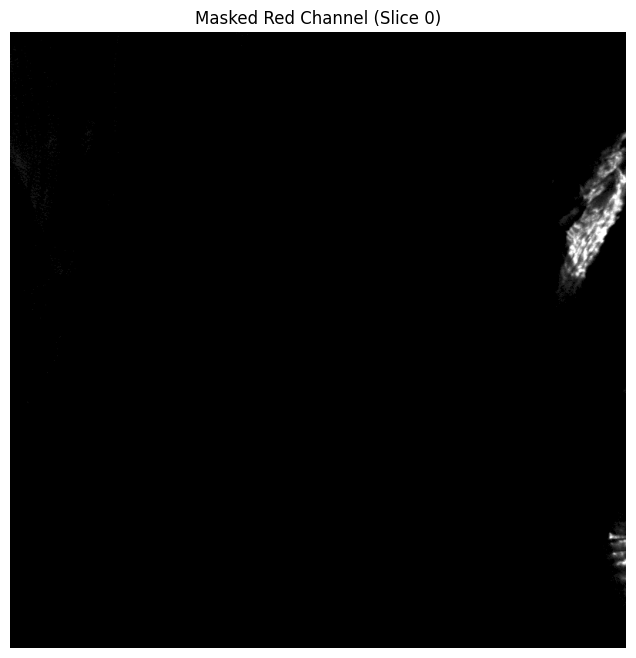

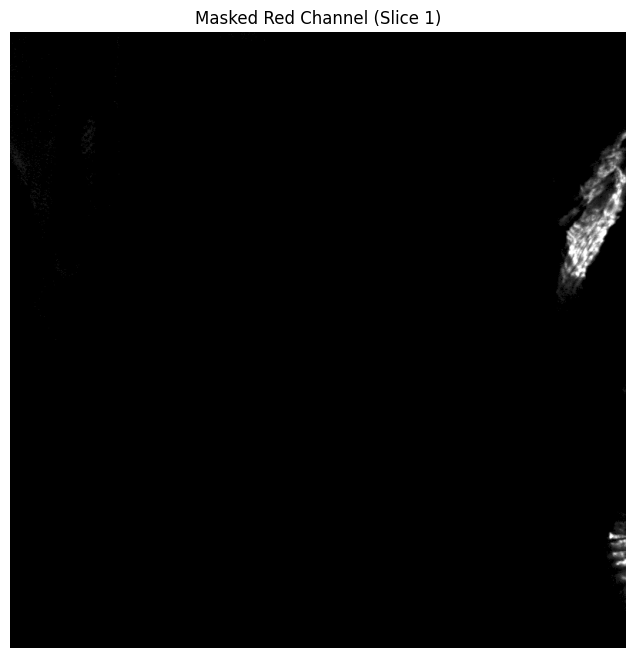

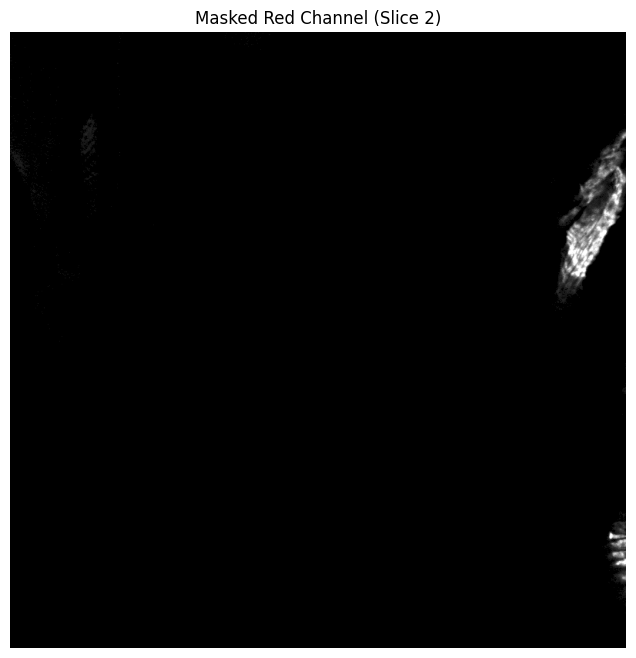

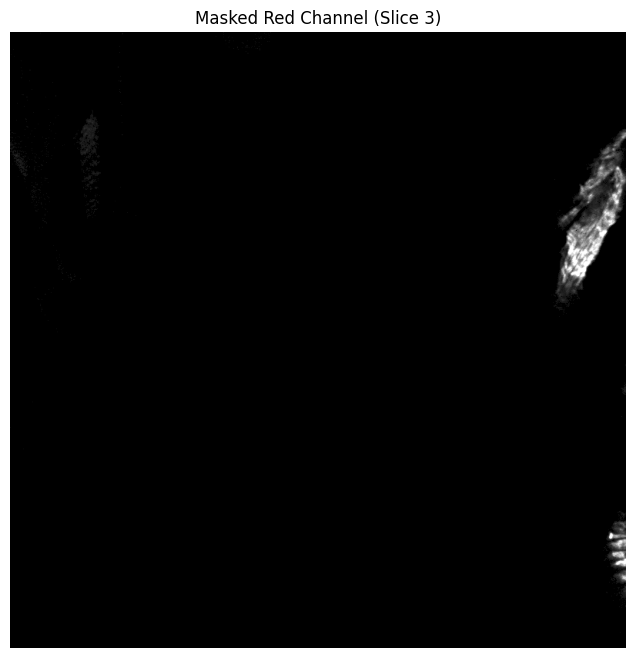

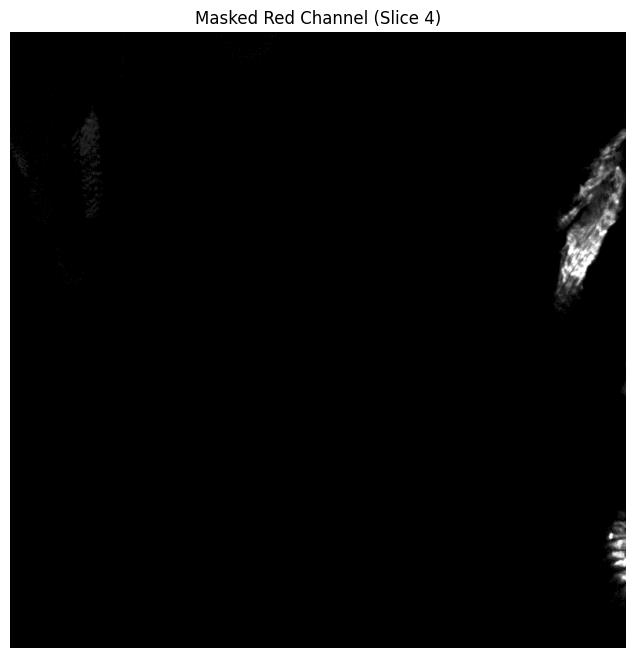

...

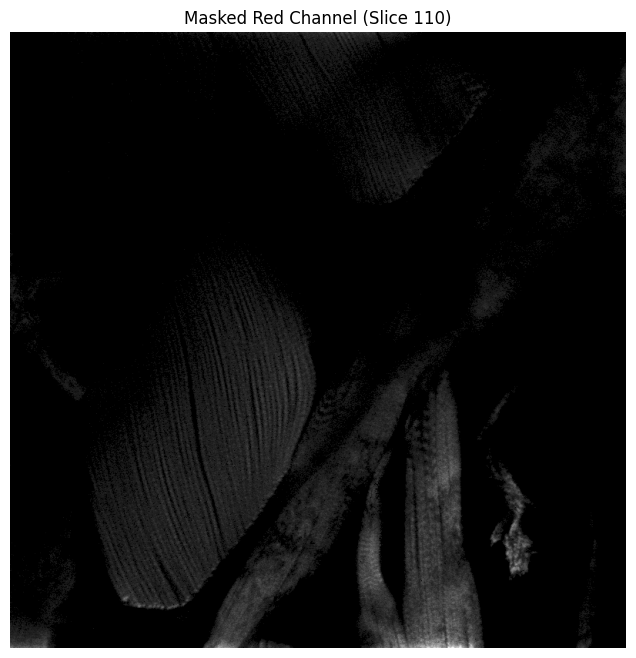

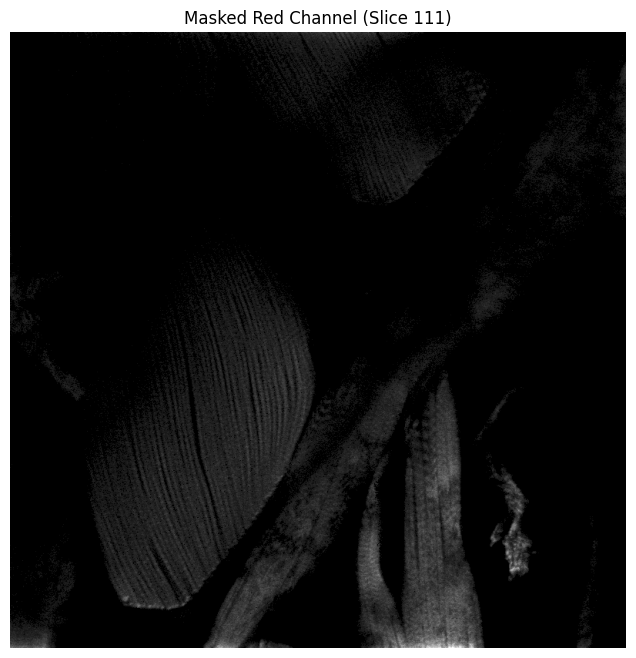

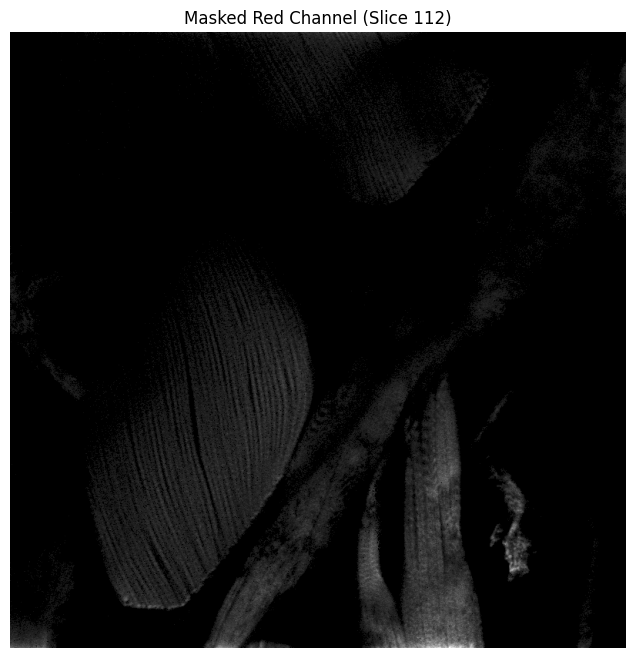

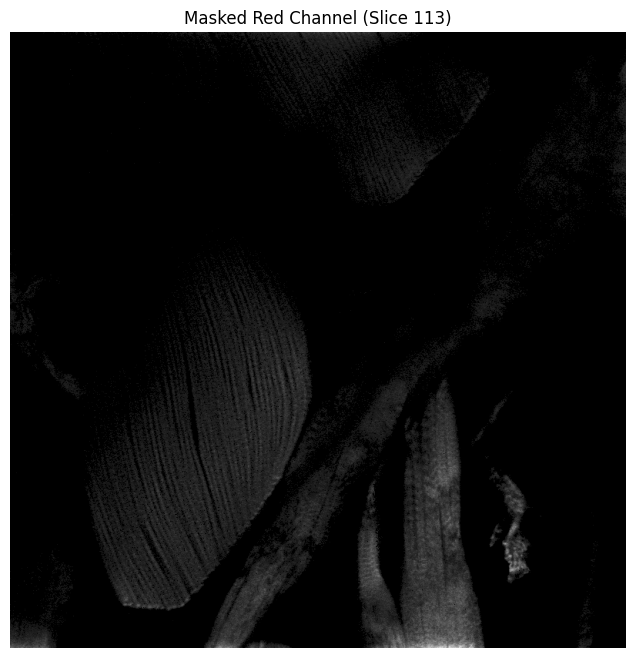

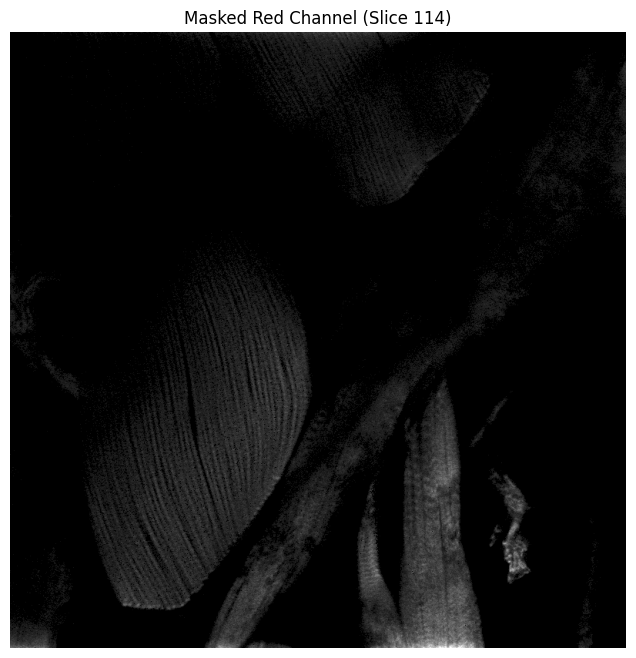

/var/folders/tz/5xxpw5x57bg8vtkdkhljt7880000gn/T/ipykernel_90124/135764978.py:92: UserWarning: /Users/camellyc/Desktop/masked_red_channel.tif is a low contrast image
  imsave('/Users/camellyc/Desktop/masked_red_channel.tif', processed_images_red_array.astype(np.uint16))
/var/folders/tz/5xxpw5x57bg8vtkdkhljt7880000gn/T/ipykernel_90124/135764978.py:93: UserWarning: /Users/camellyc/Desktop/masked_green_channel.tif is a low contrast image
  imsave('/Users/camellyc/Desktop/masked_green_channel.tif', processed_images_green_array.astype(np.uint16))


In [33]:
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from collections import Counter
from skimage.io import imsave

# Load your multi-dimensional image (assuming shape is (num_slices, channels, z, a))
image = io.imread('/Users/camellyc/Downloads/VT20126ad_20f02dbd_phalloidin_body_wall_sp2_2024_08_07.tif')  # Adjust with the actual image path

# Get dimensions of the image
num_slices, channels, z, a = image.shape

# Initialize a list to store the processed images for each slice
processed_images_red = []
processed_images_green = []

# Perform K-means clustering on the 70th slice (index 69)
slice_idx = 69  # 70th slice
green_channel_70 = image[slice_idx, 0, :, :].astype(float)
red_channel_70 = image[slice_idx, 1, :, :].astype(float)

# Normalize the intensity values of the green and red channels to the range [0, 255]
green_channel_norm_70 = (255 * (green_channel_70 - green_channel_70.min()) / (green_channel_70.max() - green_channel_70.min())).astype(np.uint8)
red_channel_norm_70 = (255 * (red_channel_70 - red_channel_70.min()) / (red_channel_70.max() - red_channel_70.min())).astype(np.uint8)

# Stack the normalized green and red channels of the 70th slice
pixels_70 = np.stack([green_channel_norm_70.flatten(), red_channel_norm_70.flatten()], axis=1)

# Apply KMeans clustering to the 70th slice
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(pixels_70)
cluster_labels_70 = kmeans.labels_  # Get the cluster assignments for each pixel in the 70th slice
cluster_centers = kmeans.cluster_centers_  # Get the cluster centers from the 70th slice

# Determine the cluster with the most pixels in the 70th slice
cluster_counts_70 = Counter(cluster_labels_70)
most_common_cluster = cluster_counts_70.most_common(1)[0][0]  # Get the cluster label with the most pixels

# Define the cluster IDs and corresponding channels
clusters = {
    0: 'red',
    1: 'green',
    2: 'blue',
    3: 'black'
}

# Ensure the most common cluster is assigned to black
for cluster_id in range(4):
    if cluster_id == most_common_cluster:
        clusters[cluster_id] = 'black'

# Loop through each slice, apply the 70th slice's clustering centers
for slice_idx in range(num_slices):
    # Separate green and red channels for the current slice
    green_channel = image[slice_idx, 0, :, :].astype(float)
    red_channel = image[slice_idx, 1, :, :].astype(float)

    # Normalize the intensity values of both channels to the range [0, 255]
    green_channel_norm = (255 * (green_channel - green_channel.min()) / (green_channel.max() - green_channel.min())).astype(np.uint16)
    red_channel_norm = (255 * (red_channel - red_channel.min()) / (red_channel.max() - red_channel.min())).astype(np.uint16)

    # Stack the normalized green and red channels to create a 2D array for clustering
    pixels = np.stack([green_channel_norm.flatten(), red_channel_norm.flatten()], axis=1)

    # Predict the cluster labels for the current slice using the 70th slice's cluster centers
    cluster_labels = kmeans.predict(pixels)

    # Create a binary mask for the blue cluster (cluster 2)
    blue_mask = (cluster_labels == 2).reshape(z, a).astype(np.uint16)
    red_mask = (cluster_labels == 0).reshape(z,a).astype(np.uint16)

    # Apply the mask to the red channel (channel 1) of the original image
    processed_image_red = red_channel * blue_mask
    processed_image_green = green_channel * red_mask
    # Append the processed image to the list
    processed_images_red.append(processed_image_red)
    processed_images_green.append(processed_image_green)

    # Optionally display the processed image
    plt.figure(figsize=(8, 8))
    plt.imshow(processed_image_red, cmap='gray')
    plt.title(f"Masked Red Channel (Slice {slice_idx})")
    plt.axis('off')
    plt.show()

# Convert the processed images list to a NumPy array for saving as a TIFF file
processed_images_red_array = np.array(processed_images_red)
processed_images_green_array = np.array(processed_images_green)

# Save the processed images as a TIFF file
imsave('/Users/camellyc/Desktop/masked_red_channel.tif', processed_images_red_array.astype(np.uint16))
imsave('/Users/camellyc/Desktop/masked_green_channel.tif', processed_images_green_array.astype(np.uint16))
# The `processed_images_array` now contains the masked red channel for all slices
